## Capstone Project
### Opening a New Cinema, London, United Kingdom

#### Business Requirement
Analyse the boroughs and neighbourhoods within the Greater London area  and identify borough(s) to open a new cinemas which has good  return on investment.

#### Importing Libraries

In [59]:
# importing necessary libs
import pandas as pd
import requests
import re
import folium
#!conda install -c conda-forge folium=0.5.0 --yes
import numpy as np
from bs4 import BeautifulSoup
from geopy.geocoders import Nominatim
from pandas.io.json import json_normalize

#### Extracting Source Data

In [60]:
# scraping data from wikipedia
res = requests.get('https://en.wikipedia.org/wiki/List_of_areas_of_London')
res.encoding = "utf-8"
soup = BeautifulSoup(res.text)
table = soup.find_all('table')[1]
table_df = pd.read_html(str(table))[0]

In [61]:
# setting up dataframe columns
table_df.columns = ['locations', 'boroughs', 'posts', 'district', 'dial', 'os']

In [62]:
# dropping columns not needed for analaysis
table_df.drop(['district', 'dial', 'os'], axis=1, inplace=True)

#### Cleaning up Source Data

In [63]:
# function to clean the wiki raw data
# the function will remove any special character assocaited with the data and also metadata like superscripts or subscripts
def clean_data_frame(row):
    hyper_pattern = r'(.)*\[[0-9]*\]'
    loc_pattern = r'(.)*\((.)*\)'
    bor_pattern = r'[A-Za-z]*'
    borough = row.boroughs
    post = row.posts
    location = row.locations
    if re.search(hyper_pattern, borough) is not None:
        matched_data = re.match(bor_pattern, borough)
        if matched_data is not None:
            borough = matched_data.group()
        else:
            borough = None
    if re.search(loc_pattern, location) is not None:
        locations = location.split('(')
        location = locations[0]
    if ',' in borough:
        boroughs = borough.split(',')
        borough = boroughs[0]
    if ',' in post:
        posts = post.split(',')
        post = posts[0]
    return {'Neighborhood': location, 'Borough': borough ,'post': post}

In [64]:
# dataframe with cleaned up data
clean_df = table_df.apply(clean_data_frame, axis=1, result_type='expand')

In [65]:
# generating cleaned up dataframe
df = pd.concat([table_df, clean_df], axis=1)

In [66]:
df = df.drop(['locations','boroughs', 'posts'], axis=1)
df

,Neighborhood,Borough,post
0,Abbey Wood,Bexley,LONDON
1,Acton,Ealing,LONDON
2,Addington,Croydon,CROYDON
3,Addiscombe,Croydon,CROYDON
4,Albany Park,Bexley,BEXLEY
...,...,...,...
528,Woolwich,Greenwich,LONDON
529,Worcester Park,Sutton,WORCESTER PARK
530,Wormwood Scrubs,Hammersmith and Fulham,LONDON
531,Yeading,Hillingdon,HAYES


In [67]:
lon_df = df[df['post'] == 'LONDON']
lon_df = lon_df.drop(['post'], axis=1)
lon_df

,Neighborhood,Borough
0,Abbey Wood,Bexley
1,Acton,Ealing
6,Aldgate,City
7,Aldwych,Westminster
9,Anerley,Bromley
...,...,...
523,Woodford,Redbridge
524,Woodford Green,Redbridge
527,Woodside Park,Barnet
528,Woolwich,Greenwich


#### Extracting location details of London Neighbourhoods

In [68]:
# function to extract geo location details of the neighbourhoods
def geo_locate_location(row):
    location = row.Neighborhood
    borough = row.Borough
    address = '{0}, UK'.format(location, borough)
    geolocator = Nominatim(user_agent="lon_explorer")
    location = geolocator.geocode(address)
    try:
        latitude = location.latitude
        longitude = location.longitude
        print('{0} - returned'.format(address))
        return {'latitude': latitude, 'longitude': longitude}
    except:
        print('{0} - returned None'.format(address))
        return {'latitude': None, 'longitude': None}

In [69]:
geo_df = lon_df.apply(geo_locate_location, axis=1, result_type='expand')

Abbey Wood, UK - returned
Acton, UK - returned
Aldgate, UK - returned
Aldwych, UK - returned
Anerley, UK - returned
Angel, UK - returned
Archway, UK - returned
Arnos Grove, UK - returned
Balham, UK - returned
Bankside, UK - returned
Barbican, UK - returned
Barnes, UK - returned
Barnet Gate, UK - returned
Barnsbury, UK - returned
Battersea, UK - returned
Bayswater, UK - returned
Beckton, UK - returned
Bedford Park, UK - returned
Belgravia, UK - returned
Bellingham, UK - returned
Belsize Park, UK - returned
Bermondsey, UK - returned
Bethnal Green, UK - returned
Blackfriars, UK - returned
Blackheath, UK - returned
Blackheath Royal Standard, UK - returned
Blackwall, UK - returned
Bloomsbury, UK - returned
Bounds Green, UK - returned
Bow, UK - returned
Bowes Park, UK - returned
Brent Cross, UK - returned
Brent Park, UK - returned
Brixton, UK - returned
Brockley, UK - returned
Bromley , UK - returned
Brompton, UK - returned
Brondesbury, UK - returned
Brunswick Park, UK - returned
Burroughs, 

In [70]:
# combining location data with the neighbourhoods data
df = pd.concat([lon_df, geo_df], axis=1)
df

,Neighborhood,Borough,latitude,longitude
0,Abbey Wood,Bexley,51.487621,0.114050
1,Acton,Ealing,51.508140,-0.273261
6,Aldgate,City,51.514248,-0.075719
7,Aldwych,Westminster,52.928619,-1.520567
9,Anerley,Bromley,51.407599,-0.061939
...,...,...,...,...
523,Woodford,Redbridge,51.606806,0.034012
524,Woodford Green,Redbridge,51.611847,0.024080
527,Woodside Park,Barnet,51.617948,-0.185579
528,Woolwich,Greenwich,51.482670,0.062334


#### Visualizing Neighbourhoods in London Boroughs

In [71]:
address = 'London, UK'

geolocator = Nominatim(user_agent="lon_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London {}, {}.'.format(latitude, longitude))

The geograpical coordinate of London 51.5073219, -0.1276474.


In [73]:
map_london = folium.Map(location=[latitude, longitude], zoom_start=11)
for lat, lng, location in zip(df['latitude'], df['longitude'], df['Neighborhood']):
    label = '{}'.format(location)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_london) 
map_london

#### Extracting Venue Details using Foursquare APIs

In [103]:
CLIENT_ID = 'XXXX' #  Foursquare ID
CLIENT_SECRET = 'XXXX' # Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: XXXX
CLIENT_SECRET:XXXX


In [24]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [74]:
import time
LIMIT = 100
def getNearbyVenues(boroughs, names, latitudes, longitudes, radius=1000):
    venues_list=[]
    count = 0
    for borough, name, lat, lng in zip(boroughs, names, latitudes, longitudes):
        count = count + 1
        print('extracting {0} of {1} - {2}'.format(count, names.size, name))
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        response = requests.get(url).json()['response']
        if 'groups' in response:
            results = response['groups'][0]['items']
        
            # return only relevant information for each nearby venue
            venues_list.append([(
                borough,
                name, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name']) for v in results])
        else:
            print('data not fetched for {0} - {1} - {2}'.format(name, lat, lng))

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Borough', 'Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [75]:
# Extracting venue details using Foursquare APIs
london_venues = getNearbyVenues(boroughs=df['Borough'], names=df['Neighborhood'], latitudes=df['latitude'], longitudes=df['longitude'])
london_venues

extracting 1 of 305 - Abbey Wood
extracting 2 of 305 - Acton
extracting 3 of 305 - Aldgate
extracting 4 of 305 - Aldwych
extracting 5 of 305 - Anerley
extracting 6 of 305 - Angel
extracting 7 of 305 - Archway
extracting 8 of 305 - Arnos Grove
extracting 9 of 305 - Balham
extracting 10 of 305 - Bankside
extracting 11 of 305 - Barbican
extracting 12 of 305 - Barnes
extracting 13 of 305 - Barnet Gate
extracting 14 of 305 - Barnsbury
extracting 15 of 305 - Battersea
extracting 16 of 305 - Bayswater
extracting 17 of 305 - Beckton
extracting 18 of 305 - Bedford Park
data not fetched for Bedford Park - 51.498020100000005 - -0.25564718577152973
extracting 19 of 305 - Belgravia
extracting 20 of 305 - Bellingham
extracting 21 of 305 - Belsize Park
extracting 22 of 305 - Bermondsey
extracting 23 of 305 - Bethnal Green
data not fetched for Bethnal Green - 51.5303456 - -0.0561633
extracting 24 of 305 - Blackfriars
extracting 25 of 305 - Blackheath
extracting 26 of 305 - Blackheath Royal Standard
ex

extracting 224 of 305 - Shoreditch
extracting 225 of 305 - Silvertown
extracting 226 of 305 - Snaresbrook
extracting 227 of 305 - Soho
extracting 228 of 305 - Somerstown
extracting 229 of 305 - South Hackney
extracting 230 of 305 - South Kensington
extracting 231 of 305 - South Norwood
extracting 232 of 305 - South Wimbledon
extracting 233 of 305 - South Woodford
extracting 234 of 305 - South Tottenham
extracting 235 of 305 - Southend
extracting 236 of 305 - Southfields
extracting 237 of 305 - Southgate
extracting 238 of 305 - Spitalfields
extracting 239 of 305 - St James's
extracting 240 of 305 - St Giles
extracting 241 of 305 - St Johns
extracting 242 of 305 - St John's Wood
extracting 243 of 305 - St Luke's
extracting 244 of 305 - St Pancras
extracting 245 of 305 - Stamford Hill
extracting 246 of 305 - Stepney
extracting 247 of 305 - Stockwell
extracting 248 of 305 - Stoke Newington
extracting 249 of 305 - Stonebridge
extracting 250 of 305 - Stratford
extracting 251 of 305 - Streath

,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bexley,Abbey Wood,51.487621,0.114050,Lesnes Abbey,51.489526,0.125839,Historic Site
1,Bexley,Abbey Wood,51.487621,0.114050,Co-op Food,51.487650,0.113490,Grocery Store
2,Bexley,Abbey Wood,51.487621,0.114050,Lidl,51.496152,0.118417,Supermarket
3,Bexley,Abbey Wood,51.487621,0.114050,Sainsbury's,51.492826,0.120524,Supermarket
4,Bexley,Abbey Wood,51.487621,0.114050,Abbey Wood Railway Station (ABW),51.490825,0.123432,Train Station
...,...,...,...,...,...,...,...,...
17402,Hammersmith and Fulham,Wormwood Scrubs,51.521380,-0.240439,Savoy Fish & Chips,51.515116,-0.248951,Fish & Chips Shop
17403,Hammersmith and Fulham,Wormwood Scrubs,51.521380,-0.240439,Wok's Cooking,51.513998,-0.246243,Chinese Restaurant
17404,Hammersmith and Fulham,Wormwood Scrubs,51.521380,-0.240439,Hurricane Room,51.515489,-0.249866,Pool Hall
17405,Hammersmith and Fulham,Wormwood Scrubs,51.521380,-0.240439,Westway Subway Tunnel,51.514537,-0.232377,Tunnel


#### Analysing venue data

In [77]:
# grouping venue details by neighbourhood
london_venues.groupby('Neighborhood').count()

,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,,
Abbey Wood,10,10,10,10,10,10,10
Acton,66,66,66,66,66,66,66
Aldgate,100,100,100,100,100,100,100
Aldwych,4,4,4,4,4,4,4
Anerley,26,26,26,26,26,26,26
...,...,...,...,...,...,...,...
Woodford,14,14,14,14,14,14,14
Woodford Green,23,23,23,23,23,23,23
Woodside Park,50,50,50,50,50,50,50


In [78]:
# looking for unique venue category
london_venues['Venue Category'].unique()

array(['Historic Site', 'Grocery Store', 'Supermarket', 'Train Station',
       'Campground', 'Coffee Shop', 'Convenience Store', 'Forest',
       'Indian Restaurant', 'Hotel', 'Creperie', 'Pub', 'Brewery',
       'Gym / Fitness Center', 'Wine Shop', 'Park',
       'Fast Food Restaurant', 'Museum', 'Fish & Chips Shop', 'Café',
       'Eastern European Restaurant', 'Bakery', 'Food & Drink Shop',
       'Sandwich Place', 'Mini Golf', 'Korean Restaurant',
       'Breakfast Spot', 'Italian Restaurant', 'Chinese Restaurant',
       'Cocktail Bar', 'Middle Eastern Restaurant', 'Pizza Place',
       'Pharmacy', 'Japanese Restaurant', 'Auto Garage', 'Deli / Bodega',
       'Metro Station', 'Platform', 'American Restaurant',
       'Kebab Restaurant', 'Yoga Studio', 'Playground', 'Restaurant',
       'Salad Place', 'Street Food Gathering', 'Garden', 'Movie Theater',
       'Sushi Restaurant', 'Mediterranean Restaurant', 'Speakeasy',
       'French Restaurant', 'Asian Restaurant', 'Art Gallery',

In [79]:
"Movie Theater" in london_venues['Venue Category'].unique()

True

In [80]:
# one hot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_onehot['Neighborhood'] = london_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Zoo Exhibit,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,American Restaurant,Animal Shelter,...,Windmill,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Xinjiang Restaurant,Yakitori Restaurant,Yoga Studio,Zoo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [81]:
to_grouped = london_onehot.groupby(["Neighborhood"]).mean().reset_index()

print(to_grouped.shape)
to_grouped

(290, 432)


,Neighborhood,Zoo Exhibit,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,American Restaurant,...,Windmill,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Xinjiang Restaurant,Yakitori Restaurant,Yoga Studio,Zoo
0,Abbey Wood,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,Acton,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.015152,...,0.0,0.0,0.015152,0.0,0.0,0.0,0.0,0.0,0.015152,0.0
2,Aldgate,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.010000,0.0
3,Aldwych,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,Anerley,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,Woodford,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
286,Woodford Green,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
287,Woodside Park,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
288,Woolwich,0.0,0.0,0.0,0.0,0.043478,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


#### Filter out for Cinema Venue

In [82]:
len(to_grouped[to_grouped["Movie Theater"] > 0])

67

In [83]:
to_cinemas = to_grouped[["Neighborhood","Movie Theater"]]

In [84]:
to_cinemas

,Neighborhood,Movie Theater
0,Abbey Wood,0.00
1,Acton,0.00
2,Aldgate,0.01
3,Aldwych,0.00
4,Anerley,0.00
...,...,...
285,Woodford,0.00
286,Woodford Green,0.00
287,Woodside Park,0.00
288,Woolwich,0.00


### K-Means Clustering

#### Look for optimal K value

In [85]:
import matplotlib.pyplot as plt
%matplotlib inline

def plot(x, y, xlabel, ylabel):
    plt.figure(figsize=(20,10))
    plt.plot(np.arange(2, x), y, 'o-')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(np.arange(2, x))
    plt.show()

In [86]:
from sklearn.cluster import KMeans

max_range = 15

london_grouped_clustering = to_cinemas.drop('Neighborhood', 1)

from sklearn.metrics import silhouette_samples, silhouette_score

indices = []
scores = []

for kclusters in range(2, max_range) :
    
    # Run k-means clustering
    kmc = london_grouped_clustering
    kmeans = KMeans(n_clusters = kclusters, init = 'k-means++', random_state = 0).fit_predict(kmc)
    
    # Gets the score for the clustering operation performed
    score = silhouette_score(kmc, kmeans)
    
    # Appending the index and score to the respective lists
    indices.append(kclusters)
    scores.append(score)

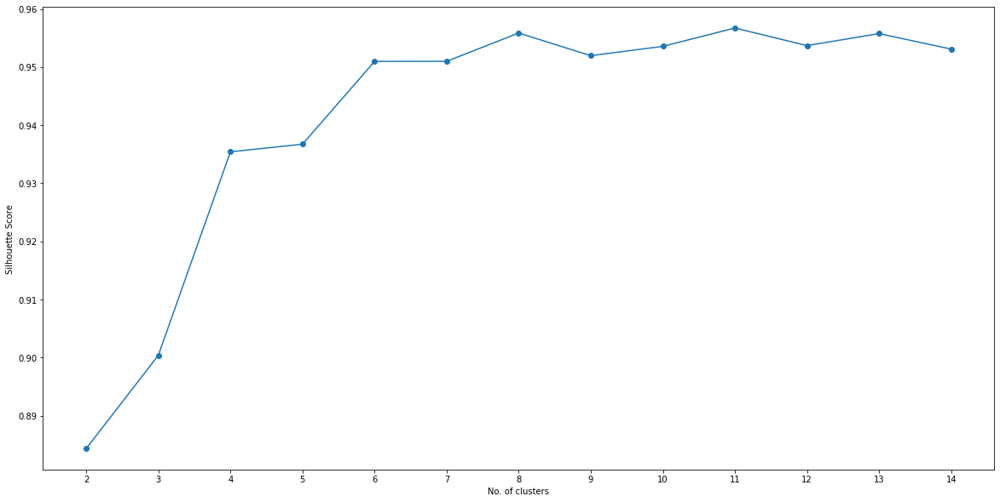

In [87]:
plot(max_range, scores, "No. of clusters", "Silhouette Score")

#### Run Data through clustering algorithm

In [88]:
from sklearn.cluster import KMeans
toclusters = 6

to_clustering = to_cinemas.drop(["Neighborhood"], 1)

# run k-means clustering
kmeans = KMeans(n_clusters=toclusters, random_state=1)
kmeans.fit_transform(to_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:20]

array([0, 0, 3, 0, 0, 3, 0, 0, 0, 0, 0, 1, 0, 1, 0, 3, 0, 0, 0, 3],
      dtype=int32)

#### Prepare Result clustered Dataset

In [89]:
to_merged = to_cinemas.copy()

# add clustering labels
to_merged["Cluster Labels"] = kmeans.labels_

In [90]:
to_merged

,Neighborhood,Movie Theater,Cluster Labels
0,Abbey Wood,0.00,0
1,Acton,0.00,0
2,Aldgate,0.01,3
3,Aldwych,0.00,0
4,Anerley,0.00,0
...,...,...,...
285,Woodford,0.00,0
286,Woodford Green,0.00,0
287,Woodside Park,0.00,0
288,Woolwich,0.00,0


In [91]:
to_merged = to_merged.join(london_venues.set_index("Neighborhood"), on="Neighborhood")

print(to_merged.shape)
to_merged.head()

(17407, 10)


,Neighborhood,Movie Theater,Cluster Labels,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Wood,0.0,0,Bexley,51.487621,0.11405,Lesnes Abbey,51.489526,0.125839,Historic Site
0,Abbey Wood,0.0,0,Bexley,51.487621,0.11405,Co-op Food,51.487650,0.113490,Grocery Store
0,Abbey Wood,0.0,0,Bexley,51.487621,0.11405,Lidl,51.496152,0.118417,Supermarket
0,Abbey Wood,0.0,0,Bexley,51.487621,0.11405,Sainsbury's,51.492826,0.120524,Supermarket
0,Abbey Wood,0.0,0,Bexley,51.487621,0.11405,Abbey Wood Railway Station (ABW),51.490825,0.123432,Train Station


In [92]:
to_merged.sort_values(["Cluster Labels"], inplace=True)

In [93]:
to_merged.head()

,Neighborhood,Movie Theater,Cluster Labels,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Wood,0.0,0,Bexley,51.487621,0.114050,Lesnes Abbey,51.489526,0.125839,Historic Site
184,Paddington,0.0,0,Westminster,51.517086,-0.177542,Heist Bank,51.518811,-0.176037,Beer Bar
184,Paddington,0.0,0,Westminster,51.517086,-0.177542,M&S Simply Food,51.516335,-0.176644,Grocery Store
184,Paddington,0.0,0,Westminster,51.517086,-0.177542,Paramount Lebanese Kitchen,51.515801,-0.174681,Lebanese Restaurant
184,Paddington,0.0,0,Westminster,51.517086,-0.177542,Mihbaj Cafe,51.516217,-0.174553,Coffee Shop


#### Visualize clustered dataset

In [94]:
map_clusters = folium.Map(location=[latitude, longitude],zoom_start=14)

# set color scheme for the clusters


# add markers to the map
markers_colors={}
markers_colors[0] = 'red'
markers_colors[1] = 'blue'
markers_colors[2] = 'green'
markers_colors[3] = 'yellow'
markers_colors[4] = 'cyan'
markers_colors[5] = 'black'
markers_colors[6] = 'lightgray'
markers_colors[7] = 'beige'
markers_colors[8] = 'orange'
for lat, lon, cluster in zip(to_merged['Neighborhood Latitude'], to_merged['Neighborhood Longitude'], to_merged['Cluster Labels']):
    
    
    folium.features.CircleMarker(
        [lat, lon],
        radius=5,
        color =markers_colors[cluster],
        fill_color=markers_colors[cluster],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

#### Analyse Clusters

In [106]:
#Cluster 1
to_merged.loc[(to_merged['Cluster Labels'] ==1) & (to_merged['Venue Category'] == 'Movie Theater') ]

,Neighborhood,Movie Theater,Cluster Labels,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
107,Hampstead,0.020000,1,Camden,51.554288,-0.174075,Everyman Cinema,51.550708,-0.166041,Movie Theater
277,Westminster,0.020000,1,Westminster,51.501356,-0.124930,Curzon Victoria,51.497473,-0.136744,Movie Theater
277,Westminster,0.020000,1,Westminster,51.501356,-0.124930,ODEON BFI IMAX,51.504995,-0.113529,Movie Theater
280,Whitechapel,0.020000,1,Tower Hamlets,51.518623,-0.062081,Genesis Cinema,51.521036,-0.051073,Movie Theater
280,Whitechapel,0.020000,1,Tower Hamlets,51.518623,-0.062081,Curzon Aldgate,51.513657,-0.069217,Movie Theater
40,Canning Town,0.023256,1,Newham,51.513989,0.008299,Secret Cinema,51.515953,0.007427,Movie Theater
129,Kensal Green,0.020408,1,Brent,51.530606,-0.224445,Lexi Cinema,51.537681,-0.222482,Movie Theater
107,Hampstead,0.020000,1,Camden,51.554288,-0.174075,Everyman Cinema,51.556358,-0.178907,Movie Theater
13,Barnsbury,0.020000,1,Islington,51.538935,-0.114735,Everyman Cinema,51.536829,-0.103488,Movie Theater
13,Barnsbury,0.020000,1,Islington,51.538935,-0.114735,Everyman Cinema,51.537280,-0.123940,Movie Theater


In [97]:
#Cluster 2
to_merged.loc[(to_merged['Cluster Labels'] ==2) & (to_merged['Venue Category'] == 'Movie Theater') ]

,Neighborhood,Movie Theater,Cluster Labels,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
186,Park Royal,0.08,2,Brent,51.526434,-0.283935,Vue,51.525700,-0.281353,Movie Theater
186,Park Royal,0.08,2,Brent,51.526434,-0.283935,Dukes Island Studios,51.526012,-0.282121,Movie Theater


In [98]:
#Cluster 3
to_merged.loc[(to_merged['Cluster Labels'] ==3) & (to_merged['Venue Category'] == 'Movie Theater') ]

,Neighborhood,Movie Theater,Cluster Labels,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
19,Belsize Park,0.010000,3,Camden,51.547393,-0.168300,Everyman Cinema,51.550708,-0.166041,Movie Theater
2,Aldgate,0.010000,3,City,51.514248,-0.075719,Curzon Aldgate,51.513657,-0.069217,Movie Theater
230,Stepney,0.010870,3,Tower Hamlets,51.517402,-0.046219,Genesis Cinema,51.521036,-0.051073,Movie Theater
41,Canonbury,0.010000,3,Islington,51.543036,-0.095401,Everyman Cinema,51.536829,-0.103488,Movie Theater
31,Brompton,0.010000,3,Kensington,51.491822,-0.178326,Science Museum (IMAX),51.497165,-0.177893,Movie Theater
241,Temple,0.010000,3,City,51.510966,-0.114335,ODEON BFI IMAX,51.504995,-0.113529,Movie Theater
5,Angel,0.010000,3,Islington,51.531946,-0.106106,Everyman Cinema,51.536829,-0.103488,Movie Theater
282,Wimbledon,0.010000,3,Merton,51.421479,-0.206403,Curzon Wimbledon,51.420346,-0.205231,Movie Theater
15,Bayswater,0.010000,3,Westminster,51.512276,-0.188385,Gate Picturehouse,51.508752,-0.197312,Movie Theater
238,Swiss Cottage,0.010000,3,Camden,51.543722,-0.174982,Everyman Cinema,51.550708,-0.166041,Movie Theater


In [99]:
#Cluster 4
to_merged.loc[(to_merged['Cluster Labels'] ==4) & (to_merged['Venue Category'] == 'Movie Theater') ]

,Neighborhood,Movie Theater,Cluster Labels,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
156,Marylebone,0.030000,4,Westminster,51.522059,-0.150455,Everyman Cinema,51.520437,-0.156609,Movie Theater
156,Marylebone,0.030000,4,Westminster,51.522059,-0.150455,Madame Tussauds 4D,51.522817,-0.154881,Movie Theater
156,Marylebone,0.030000,4,Westminster,51.522059,-0.150455,Regent Street Cinema,51.516852,-0.142657,Movie Theater
251,Tulse Hill,0.028571,4,Lambeth,51.441211,-0.102059,West Norwood Library And Picturehouse,51.433110,-0.103390,Movie Theater
110,Harlesden,0.038462,4,Brent,51.536357,-0.257833,Park Royal Studios,51.533586,-0.263187,Movie Theater


In [100]:
#Cluster 5
to_merged.loc[(to_merged['Cluster Labels'] ==5) & (to_merged['Venue Category'] == 'Movie Theater') ]

,Neighborhood,Movie Theater,Cluster Labels,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
124,Hornsey,0.015385,5,Haringey,51.587364,-0.120967,ArtHouse Cinema,51.582033,-0.120104,Movie Theater
115,Highbury,0.014286,5,Islington,51.545800,-0.102713,Everyman Cinema,51.536829,-0.103488,Movie Theater
63,Crouch End,0.015385,5,Haringey,51.578740,-0.123599,ArtHouse Cinema,51.582033,-0.120104,Movie Theater
30,Bromley,0.017241,5,Tower,51.402805,0.014814,Vue,51.398970,0.018510,Movie Theater
235,Streatham,0.015152,5,Lambeth,51.429769,-0.131110,Odeon,51.432166,-0.128610,Movie Theater
237,Surrey Quays,0.013333,5,Southwark,51.493421,-0.047832,Odeon,51.496058,-0.044867,Movie Theater
276,Westcombe Park,0.016393,5,Greenwich,51.484220,0.018879,Odeon,51.490592,0.012793,Movie Theater
102,Hackney Central,0.015625,5,Hackney,51.547061,-0.056875,Hackney Picturehouse,51.544841,-0.055399,Movie Theater
154,Manor Park,0.015152,5,Newham,51.426949,-0.135507,Odeon,51.432166,-0.128610,Movie Theater
166,Muswell Hill,0.014085,5,Haringey and Barnet,51.591040,-0.142077,Everyman Cinema,51.589740,-0.145831,Movie Theater


### Recommendation

The results from the k-means clustering show that we can categorize the neighbourhoods into 6 clusters. Going back to the business requirement, we are interested in neighbourhoods which already have densely packed cinema venues. Going by that requirement, neighbourhoods in cluster 1 and cluster 3 have more cinema venues and these neigbourhoods are ideal for opening up an cinema venue. 
